In [3]:
import os
import platform 
import torch

# Codice utile a Cristian per cambiare il path in base al sistema operativo e utilizzare GPU/MPS a seconda del caso
if platform.uname().node == "PC-Cristian":
    device = "cuda"
    main_folder = "G:\\Il mio Drive/Magistrale/Secondo Semestre/ML/PythonNotebooks/PW"
elif platform.uname().node == "MacBook-Pro-di-Cristian.local":
    device = "mps"
    main_folder = "/Users/cristian/Library/CloudStorage/GoogleDrive-c.cerasuolo2@studenti.unisa.it/Il mio Drive/Magistrale/Secondo Semestre/ML/PythonNotebooks/PW"
else:
    pass
device = torch.device(device)

In [4]:
from torchvision import transforms
from torchvision import models
def build_net():
    weights = models.EfficientNet_B4_Weights.IMAGENET1K_V1
    model = models.efficientnet_b4(weights = weights)
    preprocess = weights.IMAGENET1K_V1.transforms
    model.classifier[1] = torch.nn.Linear(in_features=1792, out_features=1, bias=True)
    return model

In [5]:
model = build_net()
model = model.to(device)
model

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=48, bias=False)
            (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(48, 12, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(12, 48, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActiv

In [6]:
import os
import os.path
import numpy as np
from PIL import Image
from torchvision import transforms
import torch
from typing import List, Union, Tuple, Any
from striprtf.striprtf import rtf_to_text
import albumentations

# NOTA: nei video il fuoco, se c'è, permane fino alla fine

class VideoRecord(object):
 # Sostanzilamente mantiene in memoria tutte le informazioni di annotazione di 
 # un particolare video 
    """
    Helper class for class VideoFrameDataset. This class
    represents a video sample's metadata.

    Args:
        root_datapath: the system path to the root folder of the videos.
        row: A list with four or more elements where
             1) The first element is the path to the video sample's frames excluding
             the root_datapath prefix
             2) The  second element is the starting frame id of the video
             3) The third element is the inclusive ending frame id of the video
             4) The fourth element is the label index.
             5) any following elements are labels in the case of multi-label classification
    """
    def __init__(self, row, root_datapath):
        # row = lista di interi che contiene:
        # 0: path del video
        # 1: primo frame del video (e qui dobbiamo decidere da dove partire)
        # 2: ultimo frame
        # 3: label della classe
        # 4: possono esserci altre annotazioni (es. fumo, fuoco)
        self._data = row
        self._path = os.path.join(root_datapath, row[0])

    @property
    def path(self) -> str:
        return self._path

    @property
    def num_frames(self) -> int:
        return self.end_frame - self.start_frame + 1  # +1 because end frame is inclusive

    @property
    def start_frame(self) -> int:
        return int(self._data[1])

    @property
    def end_frame(self) -> int:
        return int(self._data[2])

    @property
    def label(self) -> Union[int, List[int]]:
        # just one label_id
        if len(self._data) == 4:
            return int(self._data[3])
        # sample associated with multiple labels
        else:
            return [int(label_id) for label_id in self._data[3:]]


class VideoFrameDataset(torch.utils.data.Dataset):
    r"""
    A highly efficient and adaptable dataset class for videos.
    Instead of loading every frame of a video,
    loads x RGB frames of a video (sparse temporal sampling) and evenly
    chooses those frames from start to end of the video, returning
    a list of x PIL images or ``FRAMES x CHANNELS x HEIGHT x WIDTH``
    tensors.

    More specifically, the frame range [START_FRAME, END_FRAME] is divided into NUM_SEGMENTS
    segments and FRAMES_PER_SEGMENT consecutive frames are taken from each segment.

    Note:
        A demonstration of using this class can be seen
        in ``demo.py``
        https://github.com/RaivoKoot/Video-Dataset-Loading-Pytorch

    Note:
        This dataset broadly corresponds to the frame sampling technique
        introduced in ``Temporal Segment Networks`` at ECCV2016
        https://arxiv.org/abs/1608.00859.

    Args:
        root_path: The root path in which video folders lie.
                   this is ROOT_DATA from the description above.
        num_segments: The number of segments the video should
                      be divided into to sample frames from.
        frames_per_segment: The number of frames that should
                            be loaded per segment. For each segment's
                            frame-range, a random start index or the
                            center is chosen, from which frames_per_segment
                            consecutive frames are loaded.
        imagefile_template: The image filename template that video frame files
                            have inside of their video folders as described above.
        transform: Transform pipeline that receives a list of numpy images/frames.
        test_mode: If True, frames are taken from the center of each
                   segment, instead of a random location in each segment.

    """
    def __init__(self,
                 root_path: str, # dove sono contenuti i frame estratti         #? Questo non introdurrebbe dipendenza tra i dati???
                 num_segments: int = 1, # divide il video da cui caricare i
                 # frame in un certo numero di sezioni della stessa durata.
                 frames_per_segment: int = 3, # frame estratti dal segmento in maniera (di default) a caso
                 imagefile_template: str='{:05d}.jpg', # pattern nome dei frame
                 transform=None, # pipeline di augmentation preprocessing
                 totensor=True, # lasciarlo sempre a True
                 test_mode: bool = False): # quanto True, i frame vengono presi 
                 # sempre nelle stesse posizioni. È quello che vogliamo fare 
                 # quando costruiamo dataset per test o validation
        super(VideoFrameDataset, self).__init__()

        self.root_path = root_path
        self.num_segments = num_segments
        self.frames_per_segment = frames_per_segment
        self.imagefile_template = imagefile_template
        self.test_mode = test_mode

        if transform is None:
            self.transform = None
        else:
            additional_targets = {}
            for i in range(self.num_segments * self.frames_per_segment - 1):
                additional_targets["image%d" % i] = "image"
            self.transform = albumentations.Compose([transform],
                                                    additional_targets=additional_targets,
                                                    p=1)
        self.totensor = totensor
        self.totensor_transform = ImglistOrdictToTensor()

        self._parse_annotationfile()
        self._sanity_check_samples()

    def _load_image(self, directory: str, idx: int) -> Image.Image:
        return np.asarray(Image.open(os.path.join(directory, self.imagefile_template.format(idx))).convert('RGB'))

    def _parse_annotationfile(self):
        self.video_list = []
        for class_name in os.listdir(self.root_path):
            for video_name in os.listdir(os.path.join(self.root_path, class_name)):
                frames_dir = os.path.join(self.root_path, class_name, video_name)
                if os.path.isdir(frames_dir):
                    frame_path = os.path.join(class_name, video_name)
                    end_frame = len(os.listdir(frames_dir))

                    annotation_path = frames_dir\
                        .replace("\\", "/") \
                        .replace("FRAMES/", "GT/") \
                        .replace(".mp4", ".rtf")

                    with open(annotation_path, 'r') as file:
                        text = rtf_to_text(file.read())
                    if len(text):
                        label = 1
                        start_frame = int(text.split(",")[0])
                        if start_frame == 0:
                          start_frame = 1
                    else:
                        label = 0
                        start_frame = 1

                    self.video_list.append(VideoRecord(
                        [frame_path, start_frame, end_frame, label],
                        self.root_path))

    def _sanity_check_samples(self):
      # Controllo delle annotazioni ricavate per ogni video
        for record in self.video_list:
            if record.num_frames <= 0 or record.start_frame == record.end_frame:
                print(f"\nDataset Warning: video {record.path} seems to have zero RGB frames on disk!\n")

            elif record.num_frames < (self.num_segments * self.frames_per_segment):
                print(f"\nDataset Warning: video {record.path} has {record.num_frames} frames "
                      f"but the dataloader is set up to load "
                      f"(num_segments={self.num_segments})*(frames_per_segment={self.frames_per_segment})"
                      f"={self.num_segments * self.frames_per_segment} frames. Dataloader will throw an "
                      f"error when trying to load this video.\n")

    def _get_start_indices(self, record: VideoRecord) -> 'np.ndarray[int]':
        """
        For each segment, choose a start index from where frames
        are to be loaded from.

        Args:
            record: VideoRecord denoting a video sample.
        Returns:
            List of indices of where the frames of each
            segment are to be loaded from.
        """
        # choose start indices that are perfectly evenly spread across the video frames.
        if self.test_mode:
            distance_between_indices = (record.num_frames - self.frames_per_segment + 1) / float(self.num_segments)

            start_indices = np.array([int(distance_between_indices / 2.0 + distance_between_indices * x)
                                      for x in range(self.num_segments)])
        # randomly sample start indices that are approximately evenly spread across the video frames.
        else:
            max_valid_start_index = (record.num_frames - self.frames_per_segment + 1) // self.num_segments

            start_indices = np.multiply(list(range(self.num_segments)), max_valid_start_index) + \
                      np.random.randint(max_valid_start_index, size=self.num_segments)

        return start_indices

    def __getitem__(self, idx: int) -> Union[
        Tuple[List[Image.Image], Union[int, List[int]]],
        Tuple['torch.Tensor[num_frames, channels, height, width]', Union[int, List[int]]],
        Tuple[Any, Union[int, List[int]]],
        ]:
        """
        For video with id idx, loads self.NUM_SEGMENTS * self.FRAMES_PER_SEGMENT
        frames from evenly chosen locations across the video.

        Args:
            idx: Video sample index.
        Returns:
            A tuple of (video, label). Label is either a single
            integer or a list of integers in the case of multiple labels.
            Video is either 1) a list of PIL images if no transform is used
            2) a batch of shape (NUM_IMAGES x CHANNELS x HEIGHT x WIDTH) in the range [0,1]
            if the transform "ImglistToTensor" is used
            3) or anything else if a custom transform is used.
        """
        record: VideoRecord = self.video_list[idx]

        frame_start_indices: 'np.ndarray[int]' = self._get_start_indices(record)

        return self._get(record, frame_start_indices)

    def _get(self, record: VideoRecord, frame_start_indices: 'np.ndarray[int]') -> Union[
        Tuple[List[Image.Image], Union[int, List[int]]],
        Tuple['torch.Tensor[num_frames, channels, height, width]', Union[int, List[int]]],
        Tuple[Any, Union[int, List[int]]],
        ]:
        """
        Loads the frames of a video at the corresponding
        indices.

        Args:
            record: VideoRecord denoting a video sample.
            frame_start_indices: Indices from which to load consecutive frames from.
        Returns:
            A tuple of (video, label). Label is either a single
            integer or a list of integers in the case of multiple labels.
            Video is either 1) a list of PIL images if no transform is used
            2) a batch of shape (NUM_IMAGES x CHANNELS x HEIGHT x WIDTH) in the range [0,1]
            if the transform "ImglistToTensor" is used
            3) or anything else if a custom transform is used.
        """

        frame_start_indices = frame_start_indices + record.start_frame
        images = list()

        # from each start_index, load self.frames_per_segment
        # consecutive frames
        for start_index in frame_start_indices:
            frame_index = int(start_index)

            # load self.frames_per_segment consecutive frames
            for _ in range(self.frames_per_segment):
                image = self._load_image(record.path, frame_index)
                images.append(image)

                if frame_index < record.end_frame:
                    frame_index += 1

        if self.transform is not None:
            transform_input = {"image": images[0]}
            for i, image in enumerate(images[1:]):
                transform_input["image%d" % i] = image
            images = self.transform(**transform_input)

        if self.totensor:
            images = self.totensor_transform(images)
        return images, record.label

    def __len__(self):
        return len(self.video_list)


class ImglistOrdictToTensor(torch.nn.Module):
    """
    Converts a list or a dict of numpy images to a torch.FloatTensor
    of shape (NUM_IMAGES x CHANNELS x HEIGHT x WIDTH).
    Can be used as first transform for ``VideoFrameDataset``.
    """
    @staticmethod
    def forward(img_list_or_dict):
        """
        Converts each numpy image in a list or a dict to
        a torch Tensor and stacks them into a single tensor.

        Args:
            img_list_or_dict: list or dict of numpy images.
        Returns:
            tensor of size ``NUM_IMAGES x CHANNELS x HEIGHT x WIDTH``
        """
        if isinstance(img_list_or_dict, list):
            return torch.stack([transforms.functional.to_tensor(img)
                                for img in img_list_or_dict])
        else:
            return torch.stack([transforms.functional.to_tensor(img_list_or_dict[k])
                                for k in img_list_or_dict.keys()])


In [7]:
import cv2 

# Preprocessing and augmentation
# applica sempre, ha senso per il preprocessing
preprocessing = albumentations.Sequential([
    albumentations.Resize(height=384, width=384, always_apply=True, interpolation=cv2.INTER_CUBIC),
    albumentations.CenterCrop(380, 380, always_apply=True),
    albumentations.Normalize(mean=[0.485, 0.456, 0.406],
                                std=[0.229, 0.224, 0.225],
                                max_pixel_value=255.,
                                always_apply=True), 
])

augmentation = albumentations.OneOf([
    albumentations.HorizontalFlip(p=0.2),
    albumentations.Rotate(p=1., limit=30),
    albumentations.VerticalFlip(p=0.2),
    albumentations.GaussNoise(p=0.2),
    ], p=.5)

# Dataset for training
train_dataset = VideoFrameDataset(root_path="FRAMES/TRAINING_SET/",
                            num_segments=1,
                            frames_per_segment=1,
                            transform=albumentations.Compose([
                                preprocessing,
                                augmentation],
                                p=1.,
                            )
                            )

val_dataset = VideoFrameDataset(root_path="FRAMES/VALIDATION_SET/",
                            num_segments=1,
                            frames_per_segment=1,
                            transform=albumentations.Compose([
                                preprocessing,
                                augmentation],
                                p=1.,
                            ),
                            test_mode=True
                            )                                            

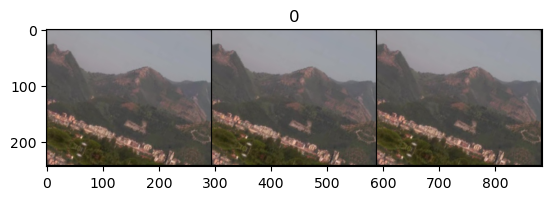

c:\Users\crist\anaconda3\envs\MachineLearning\lib\site-packages\torchvision\transforms\functional.py:152: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at C:\cb\pytorch_1000000000000\work\torch\csrc\utils\tensor_numpy.cpp:212.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()


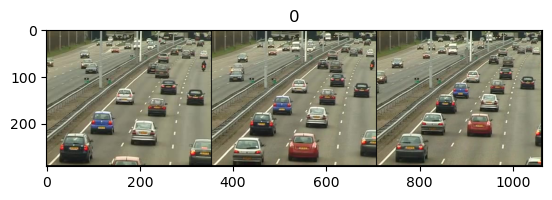

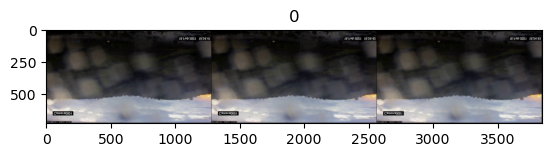

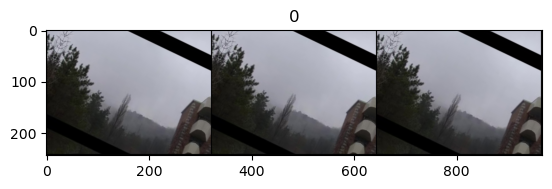

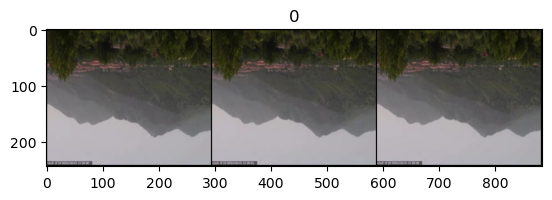

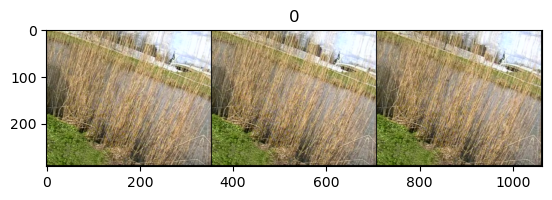

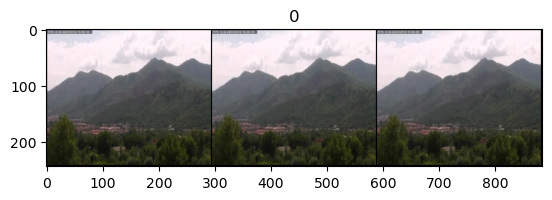

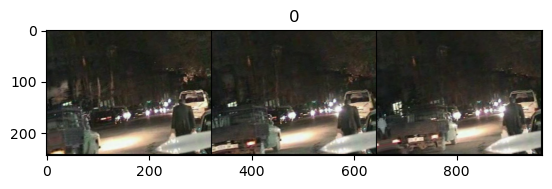

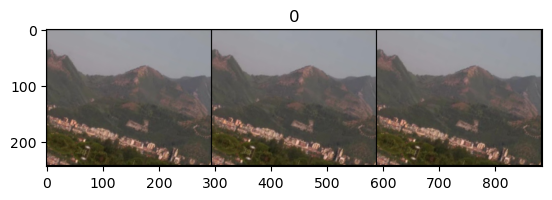

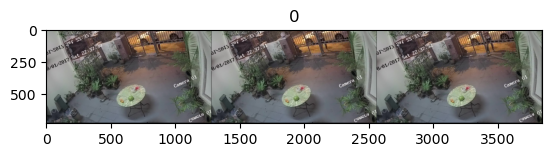

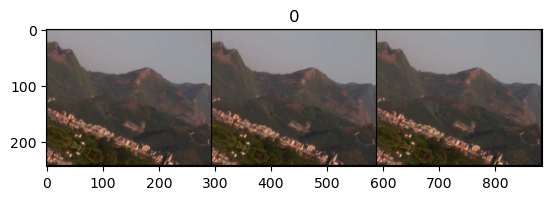

In [8]:
def demo_visualization():
    from torchvision.utils import make_grid
    import matplotlib.pyplot as plt

    # Augmentation
    # OneOf prende in ingresso una lista di augmentation ed applica con una
    # certa probabilità solo una augmentation di questa lista (presa casualmente)
    augmentation = albumentations.OneOf([
        albumentations.HorizontalFlip(p=0.2),
        albumentations.Rotate(p=1., limit=30),
        albumentations.VerticalFlip(p=0.2),
        albumentations.GaussNoise(p=0.2),
        ], p=.5)

    # Dataset with augmentation for visualization
    dataset = VideoFrameDataset(root_path="FRAMES/TRAINING_SET/",
                                num_segments=1,
                                frames_per_segment=3,
                                transform=augmentation,
                                )
    counter = 0
    for X, y in dataset:
        if counter > 10:
            break
        plt.figure()
        plt.imshow(make_grid(X).numpy().transpose((1, 2, 0)))
        plt.title(y)
        plt.show()
        counter += 1



demo_visualization()

# Questa demo è utile per testare l'augumentation prima di far iniziare il
# training per un certo numero di ore

# Training monitoring
In order to use [TensorBoard](https://pytorch.org/docs/stable/tensorboard.html), we will create a [SummaryWriter](https://pytorch.org/docs/stable/tensorboard.html#torch.utils.tensorboard.writer.SummaryWriter) object:

In [9]:
from torch.utils.tensorboard import SummaryWriter
from tensorboard import notebook

def start_tensorboard(log_dir):
  writer = SummaryWriter(os.path.join("runs", log_dir))

  # run tensorboard in background
  ! killall tensorboard
  %load_ext tensorboard
  %tensorboard --logdir ./runs

  notebook.list() # View open TensorBoard instances

  return writer

#Training and validation procedures

In [10]:
from torchvision.utils import make_grid
from tqdm import tqdm

def one_epoch(model, lossFunction, output_activation, optimizer, train_loader, val_loader, writer, epoch_num):
  model = model.to(device)

  model.train()

  i_start = epoch_num * len(train_loader)
  for i, (X, y) in tqdm(enumerate(train_loader), desc="epoch {} - train".format(epoch_num)):
    
    # remove the second dimension (num_segments)
    #X = X.squeeze(1)

    # Merge the first dimension (batch_size) and the second dimension (num_segments)
    X = X.reshape(-1, *X.shape[2:])
    
    X = X.to(device)
    y = y.to(device).float()

    optimizer.zero_grad()

    o = model(X)
    o = output_activation(o).squeeze()

    # print("Output", o.shape)
    # print("Label", y.shape)

    # make shape of o and y the same
    if o.shape != y.shape:
      o = o.reshape(y.shape)
      
    l = lossFunction(o, y)


    l.backward()
    optimizer.step()

    acc = ((o.detach() > .5) == y.detach()).float().mean()
    
    # print("- batch loss and accuracy : {:.7f}\t{:.4f}".format(l.detach().item(), acc))
    writer.add_scalar('train/loss', l.detach().item(), i_start+i)
    writer.add_scalar('train/acc', acc, i_start+i)

  model.eval()
  with torch.no_grad():
    val_loss = []
    val_corr_pred = []
    for X, y in tqdm(val_loader, desc="epoch {} - validation".format(epoch_num)):
      # Merge the first dimension (batch_size) and the second dimension (num_segments)
      X = X.reshape(-1, *X.shape[2:])
      
      X = X.to(device)
      y = y.to(device).float()

      o = model(X)
      o = output_activation(o).squeeze()
      val_loss.append(lossFunction(o, y))
      val_corr_pred.append((o > .5) == y)

    val_loss = torch.stack(val_loss).mean().item()
    val_accuracy = torch.concatenate(val_corr_pred).float().mean().item()

    # print("Validation loss and accuracy : {:.7f}\t{:.4f}".format(val_loss, val_accuracy))
    writer.add_scalar('val/loss', val_loss, i_start+i)
    writer.add_scalar('val/acc', val_accuracy, i_start+i)
  return val_loss, val_accuracy

#Run the code

In [12]:
from torch.nn import BCELoss, CrossEntropyLoss, Sigmoid, Softmax

# learning parameters
lossFunction, output_activation = BCELoss(), Sigmoid()
batch_size = 10
lr = .001
momentum = .9
lambda_reg = 0

epochs = 500
early_stopping_patience = 5

# network parameters
for param in model.parameters():
  param.requires_grad = False
for param in model.classifier[1].parameters():
  param.requires_grad = True
optimizer = torch.optim.SGD(model.classifier[1].parameters(),
                          lr=lr,
                          weight_decay=lambda_reg,
                          momentum=momentum)

# create output directory and logger
experiment_name = "EfficientNet_finetuning"

In [ ]:
import os
os.makedirs(experiment_name)
writer = start_tensorboard(experiment_name)

In [ ]:
from torch.utils.data import DataLoader
dataloader_params = {"batch_size": batch_size, "num_workers": 0, "pin_memory": True}
train_loader = DataLoader(train_dataset, shuffle=True, **dataloader_params)
val_loader = DataLoader(val_dataset, shuffle=False, **dataloader_params)

# early stopping and best model saving
early_stopping_counter = early_stopping_patience
min_val_loss = 1e10

# training and validation
val_losses = torch.zeros(epochs)
val_accuracies = torch.zeros(epochs)
for e in range(epochs):
  print("EPOCH {}".format(e))
  val_loss, val_accuracy = one_epoch(model, lossFunction, output_activation, optimizer, train_loader, val_loader, writer, e)

  # store the validation metrics
  val_losses[e] = val_loss
  val_accuracies[e] = val_accuracy
  torch.save(val_losses, os.path.join(experiment_name,'val_losses.pth'))
  torch.save(val_accuracies, os.path.join(experiment_name,'val_accuracies.pth'))

  # save the best model and check the early stopping criteria
  if val_loss < min_val_loss: # save the best model
    min_val_loss = val_loss
    early_stopping_counter = early_stopping_patience # reset early stopping counter
    torch.save(model.state_dict(), os.path.join(experiment_name,'best_model.pth'))
    print("- saved best model: val_loss =", val_loss, "val_accuracy =", val_accuracy)

  if e>0: # early stopping counter update
    if val_losses[e] > val_losses[e-1]:
        early_stopping_counter -= 1 # update early stopping counter
    else:
        early_stopping_counter = early_stopping_patience # reset early stopping counter
  if early_stopping_counter == 0: # early stopping
      break

In [13]:
from torch.utils.data import DataLoader

test_dataset = VideoFrameDataset(root_path="FRAMES/TEST_SET/",
                            num_segments=1,
                            frames_per_segment=1,
                            transform=albumentations.Compose([
                                preprocessing,
                                augmentation],
                                p=1.,
                            ),
                            test_mode=True
                            ) 

dataloader_params = {"batch_size": batch_size, "num_workers": 0, "pin_memory": True}
test_loader = DataLoader(test_dataset, shuffle=False, **dataloader_params)

model = build_net().to(device)
# model.load_state_dict(torch.load(os.path.join(experiment_name,'best_model.pth')))
model.load_state_dict(torch.load("EfficientNet_finetuning_17_06/best_model.pth"))

Y, Y_hat = [], []
with torch.no_grad():
  model.eval()
  for X, y in test_loader:
    # Merge the first dimension (batch_size) and the second dimension (num_segments)
    X = X.reshape(-1, *X.shape[2:])
    Y.append(y)
    Y_hat.append((output_activation(model(X.to(device))) > .5).squeeze().cpu())

Y = torch.concatenate(Y)
Y_hat = torch.concatenate(Y_hat)
print("Test accuracy:", (Y==Y_hat).float().mean().item())

Test accuracy: 0.939393937587738


In [14]:
from sklearn.metrics import confusion_matrix
confusion_matrix(Y, Y_hat)

array([[ 9,  1],
       [ 1, 22]], dtype=int64)

In [ ]:
import urllib
from PIL import Image
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

url = "https://media.cnn.com/api/v1/images/stellar/prod/220914082907-01-mosquito-fire-0913.jpg?c=16x9&q=h_720,w_1280,c_fill/f_webp"
#url = "https://st4.depositphotos.com/12873196/23534/i/1600/depositphotos_235349260-stock-photo-white-clouds-blue-sky-rain.jpg"
url = "https://media.npr.org/assets/img/2022/07/23/ap22204449616407_custom-9b9211481a08425e25f3eacaf856f08e80b3cccc-s800-c85.webp"
url = "https://media.npr.org/assets/img/2022/07/24/ap22205238058767_custom-b3a837eb18ecf6b5d640373a5e175bc83ca69fbe-s800-c85.webp"
url = "https://richmondstandard.com/wp-content/uploads/2022/12/housefire.12-26.jpg"
url = "https://www.cp24.com/polopoly_fs/1.6352512!/httpImage/image.jpg_gen/derivatives/landscape_620/image.jpg"
url = "https://www.ocregister.com/wp-content/uploads/2018/08/1533588088-1.jpg"
url = "https://t3.ftcdn.net/jpg/01/02/64/28/360_F_102642850_Mca9lTRDH60DQin39YwCF5Jzd15lcdoo.jpg"
url ="https://d1hjkbq40fs2x4.cloudfront.net/2020-06-02/files/colourful-sky-sunset_2052-01.jpg"
url = "https://www.marocco.org/wp-content/uploads/sites/73/sahara-occidentale.jpg"
filename = "test.jpg"

try: urllib.URLopener().retrieve(url, filename)
except: urllib.request.urlretrieve(url, filename)

# filename = "FRAMES/TEST_SET/1/Video61.mp4/00142.jpg"
input_image = Image.open(filename)
display(input_image)

preprocessing = transforms.Compose([
    transforms.Resize((384, 384), interpolation=Image.BICUBIC),
    transforms.CenterCrop((380, 380)),
    transforms.ToTensor(), 
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

input_tensor = preprocessing(input_image)

# display the tensor as an image
plt.figure(figsize=(10,10))
plt.imshow(input_tensor.permute(1, 2, 0))
plt.show()

input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model
with torch.no_grad():
  model.eval()
  pred = output_activation(model(input_batch.to(device))).cpu().numpy().item()
print("\nPrediction:", pred)